# IMPORTING MODEL WITH PRE-TRAINED WEIGHTS

In [3]:
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 
import os
import PIL.Image
import cv2
import random
from PIL import Image # Python Image Library is a library that adds support for opening, manipulating, and saving many different
                      # image file formats

In [5]:
tf.__version__

'2.19.0'

In [7]:
# Load trained inceptionNet model, for more information on Transfer Learning, check previous case studies
base_model = tf.keras.applications.InceptionV3(include_top = False, weights = 'imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


# GETRING AN IMAGE AND PRE-PROCESSING IT

In [21]:
img_1 = Image.open("Creative AI Dataset/eiffel.jpg")
img_2 = Image.open("Creative AI Dataset/mars.jpg")

image = Image.blend(img_1, img_2, 0.5)
image.save("img_0.jpg")

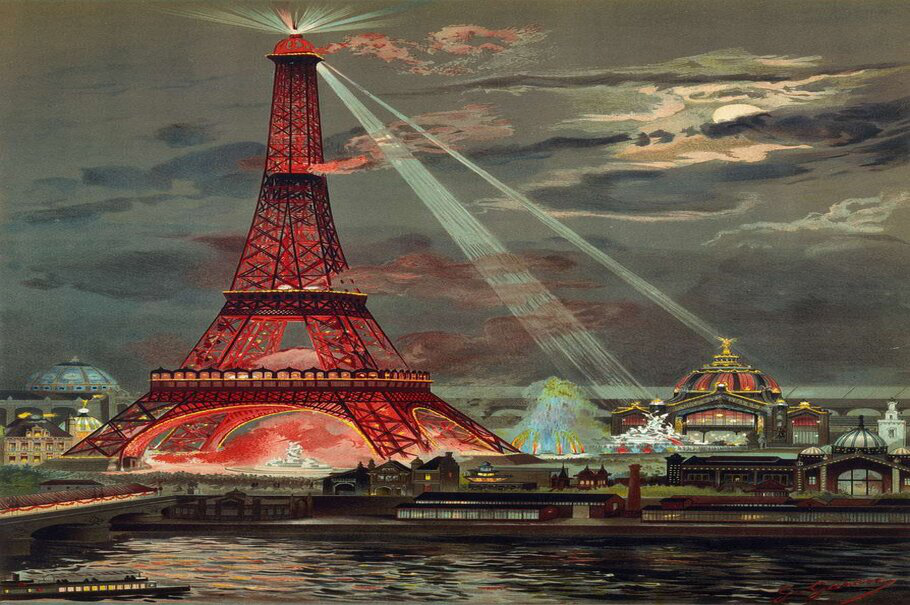

In [23]:
img_1

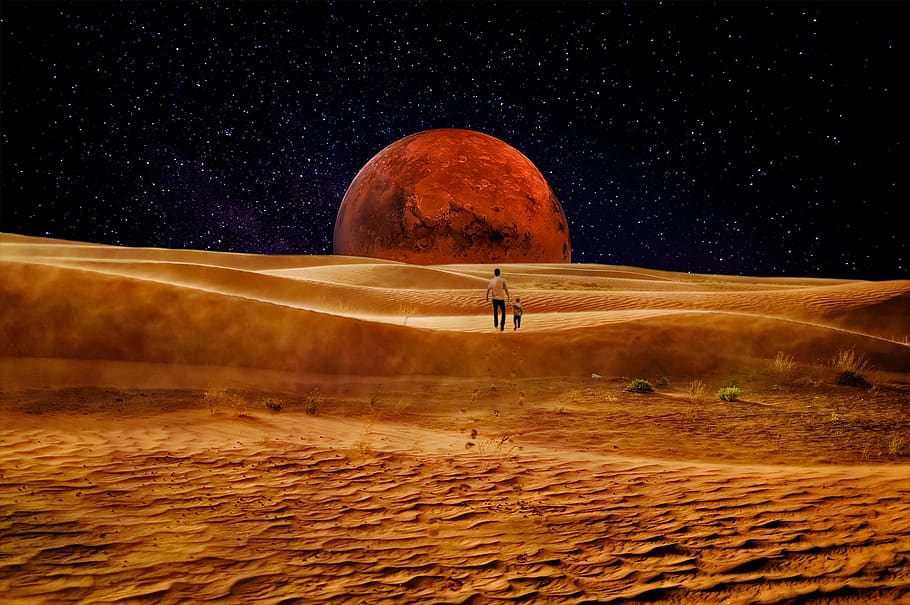

In [25]:
img_2

In [31]:
# Load the image
Sample_Image = tf.keras.preprocessing.image.load_img('img_0.jpg')

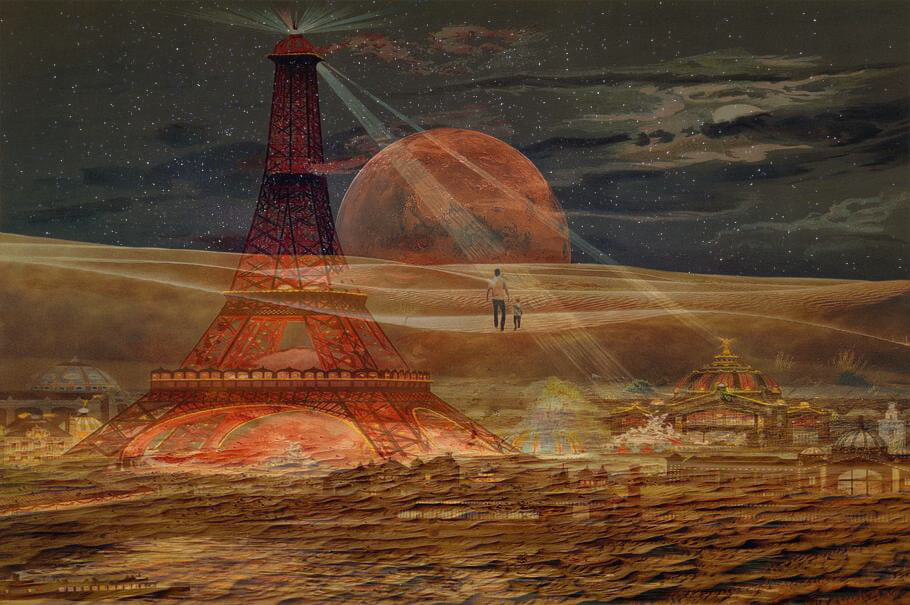

In [33]:
Sample_Image

In [35]:
# Getting the shape of the image
np.shape(Sample_Image)

(605, 910, 3)

In [37]:
# Checking out the type of the image
type(Sample_Image)

PIL.JpegImagePlugin.JpegImageFile

In [39]:
# Converting to numpy array
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)

# Sample_Image = np.array(Sample_Image)

In [41]:
# Confirm that the image is converted to Numpy array
type(Sample_Image)

numpy.ndarray

In [43]:
# Obtaining the max and min values
print('min pixel values = {}, max pixel values = {}'.format(Sample_Image.min(), Sample_Image.max()))

min pixel values = 0.0, max pixel values = 255.0


In [45]:
# Normalizing the input image
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image.shape

(605, 910, 3)

In [47]:
# Let's verify normalized images values!
print('min pixel values = {}, max pixel values = {}'.format(Sample_Image.min(), Sample_Image.max()))

min pixel values = 0.0, max pixel values = 1.0


In [49]:
Sample_Image = tf.expand_dims(Sample_Image, axis = 0)

In [51]:
np.shape(Sample_Image)

TensorShape([1, 605, 910, 3])

# RUNNING THE PRETRAINED MODEL AND EXPLORE ACTIVATIONS

In [54]:
base_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [56]:
# Maximizing the activations of these layers

names = ['mixed3', 'mixed5', 'mixed7']

# names = ['mixed3']

layers = [base_model.get_layer(name).output for name in names]

# Creating the feature extraction model
deepdream_model = tf.keras.Model(inputs = base_model.input, outputs = layers)

In [58]:
deepdream_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 8,975,264 (34.24 MB)

 Trainable params: 8,956,448 (34.17 MB)

 Non-trainable params: 18,816 (73.50 KB)

In [60]:
# Let's run the model by feeding in our input image and taking a look at the activations "Neuron outputs"
activations = deepdream_model(Sample_Image)
activations

[<tf.Tensor: shape=(1, 36, 55, 768), dtype=float32, numpy=
 array([[[[0.        , 0.        , 0.        , ..., 0.        ,
           0.49032336, 0.30896923],
          [0.        , 0.08471677, 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.3008685 , 0.        , ..., 0.        ,
           0.03278697, 0.        ],
          ...,
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.38026673,
           0.07960021, 0.        ],
          [0.        , 0.        , 0.        , ..., 0.38026673,
           0.71590847, 0.02941084]],
 
         [[0.67819536, 0.        , 0.        , ..., 0.        ,
           0.34486556, 0.71190315],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.32797223],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          ...,
        

In [62]:
len(activations)

3

# UNDERSTANDING HOW TO PERFORM GRADIENT CALCULATION AND TF.GRADIENTTAPE()

In [65]:
x = tf.constant(2.0)

In [67]:
with tf.GradientTape() as g:
  g.watch(x)
  y = x * x * x
dy_dx = g.gradient(y, x) # Will compute to 12

In [69]:
dy_dx

<tf.Tensor: shape=(), dtype=float32, numpy=12.0>

In [71]:
x = tf.constant(5.0)

In [73]:
with tf.GradientTape() as g:
  g.watch(x)
  y = (x * x * x * x) + (x * x * x * x * x)  
dy_dx = g.gradient(y, x) 
dy_dx

<tf.Tensor: shape=(), dtype=float32, numpy=3625.0>

# IMPLEMENTING DEEP DREAM ALGORITHM

## STEP #1 LOSS CALCULATION

In [77]:
# Since the cal_closs function includes expand dimension, let's squeeze the image (reduce_dims)
Sample_Image.shape

TensorShape([1, 605, 910, 3])

In [79]:
Sample_Image = tf.squeeze(Sample_Image, axis = 0)

In [81]:
Sample_Image.shape

TensorShape([605, 910, 3])

In [121]:
def calc_loss(image, model):
# Function used for loss calculations
# It works by feedforwarding the input image through the network and generate activations
# Then obtain the average and sum of those outputs

  img_batch = tf.expand_dims(image, axis=0) # Convert into batch format
  layer_activations = model(img_batch) # Run the model
  print('ACTIVATION VALUES (LAYER OUTPUT) =\n', layer_activations)
  # print('ACTIVATION SHAPE =\n', np.shape(layer_activations))

  losses = [] # accumulator to hold all the losses
  for act in layer_activations:
    loss = tf.math.reduce_mean(act) # calculate mean of each activation 
    losses.append(loss)
  
  print('LOSSES (FROM MULTIPLE ACTIVATION LAYERS) = ', losses)
  print('LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) = ', tf.shape(losses))
  print('SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)= ', tf.reduce_sum(losses))

  return  tf.reduce_sum(losses) # Calculate sum 

In [123]:
loss = calc_loss(tf.Variable(Sample_Image), deepdream_model)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor: shape=(1, 36, 55, 768), dtype=float32, numpy=
array([[[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
   

In [87]:
loss # Sum up the losses from both activations

<tf.Tensor: shape=(), dtype=float32, numpy=0.5577919483184814>

## STEP #2 CALCULATING THE GRADIENT

In [125]:
@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      # This needs gradients relative to `img`
      # `GradientTape` only watches `tf.Variable`s by default
      tape.watch(image)
      loss = calc_loss(image, model) # call the function that calculate the loss 

    # Calculate the gradient of the loss with respect to the pixels of the input image.
    # The syntax is as follows: dy_dx = g.gradient(y, x) 
    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', tf.shape(gradients))

    # tf.math.reduce_std computes the standard deviation of elements across dimensions of a tensor
    gradients /= tf.math.reduce_std(gradients)  

    # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
    # You can update the image by directly adding the gradients (because they're the same shape!)
    image = image + gradients * step_size
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [127]:
def run_deep_dream_simple(model, image, steps = 100, step_size = 0.01):
  # Convert from uint8 to the range expected by the model.
  image = tf.keras.applications.inception_v3.preprocess_input(image)

  for step in range(steps):
    loss, image = deepdream(model, image, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  # clear_output(wait=True)
  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

In [129]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)


In [131]:
Sample_Image.shape

(605, 910, 3)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'functional_1/mixed3_1/concat:0' shape=(1, 36, 55, 768) dtype=float32>, <tf.Tensor 'functional_1/mixed5_1/concat:0' shape=(1, 36, 55, 768) dtype=float32>, <tf.Tensor 'functional_1/mixed7_1/concat:0' shape=(1, 36, 55, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>, <tf.Tensor 'Mean_2:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  Tensor("Shape:0", shape=(1,), dtype=int32)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_4:0", shape=(605, 910, 3), dtype=float32)
GRADIENTS SHAPE =
 Tensor("Shape_1:0", shape=(3,), dtype=int32)


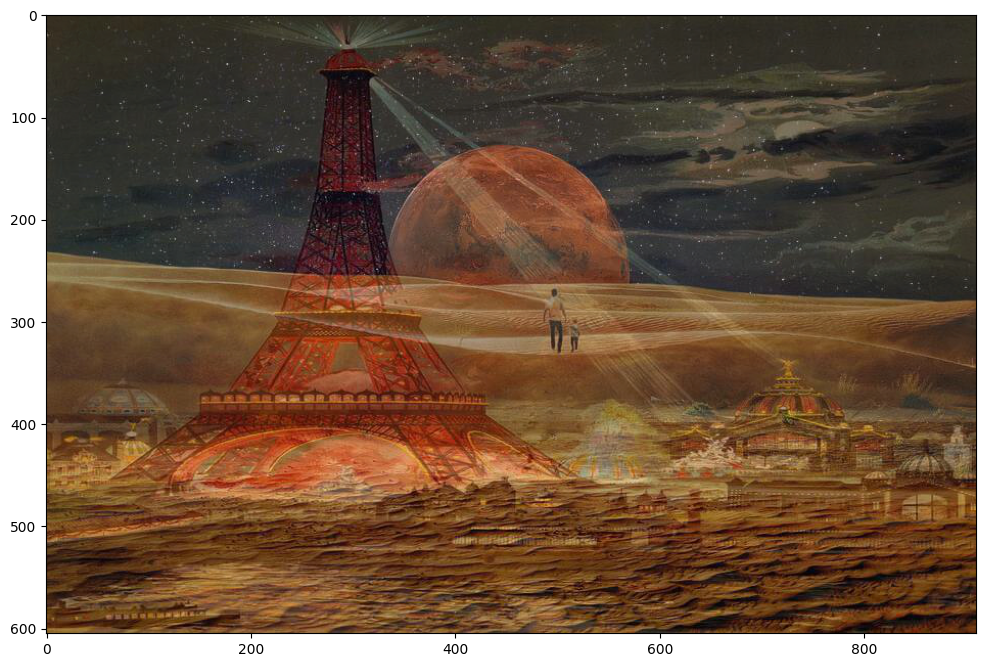

Step 0, loss 0.5805509686470032


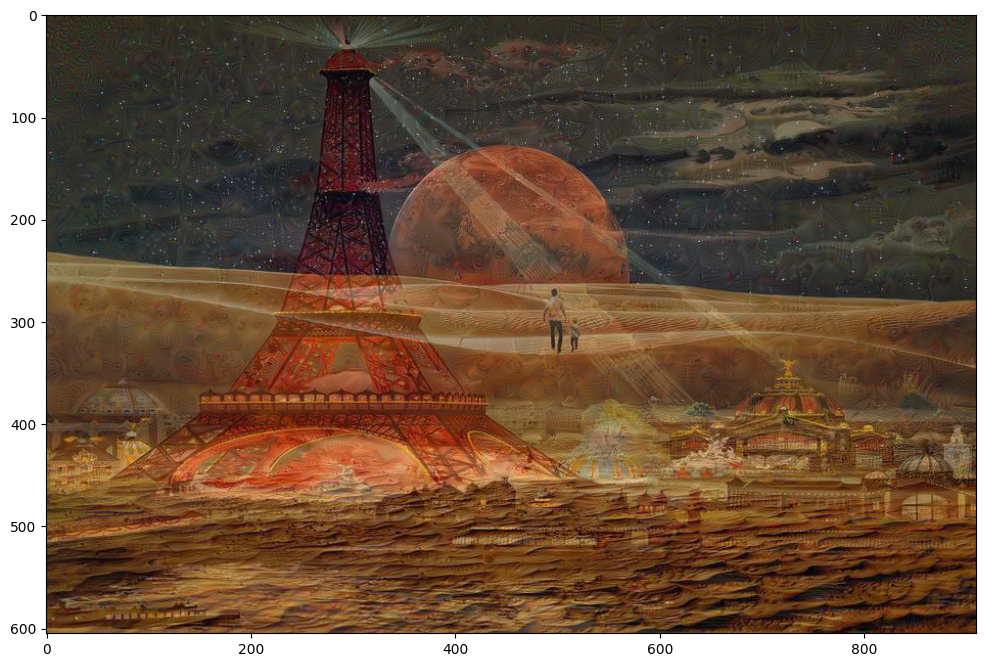

Step 100, loss 1.2860455513000488


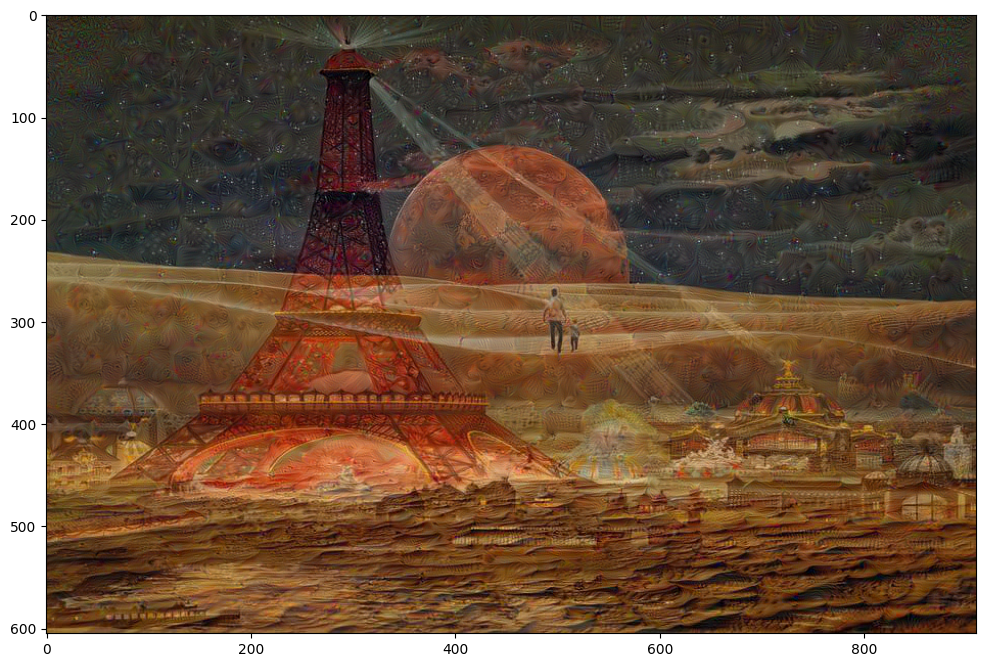

Step 200, loss 1.504696011543274


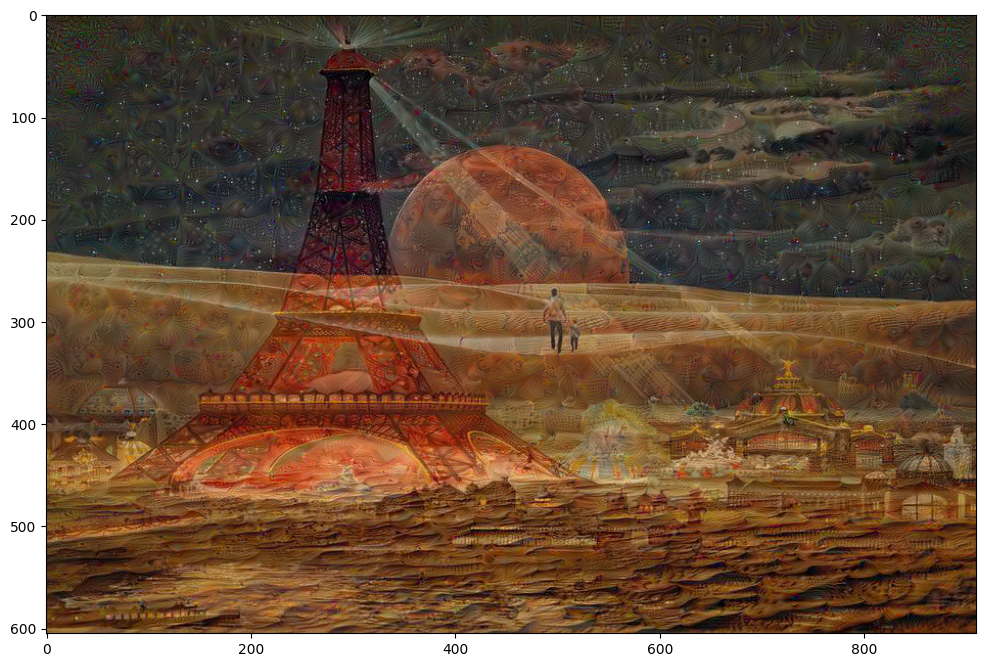

Step 300, loss 1.6394356489181519


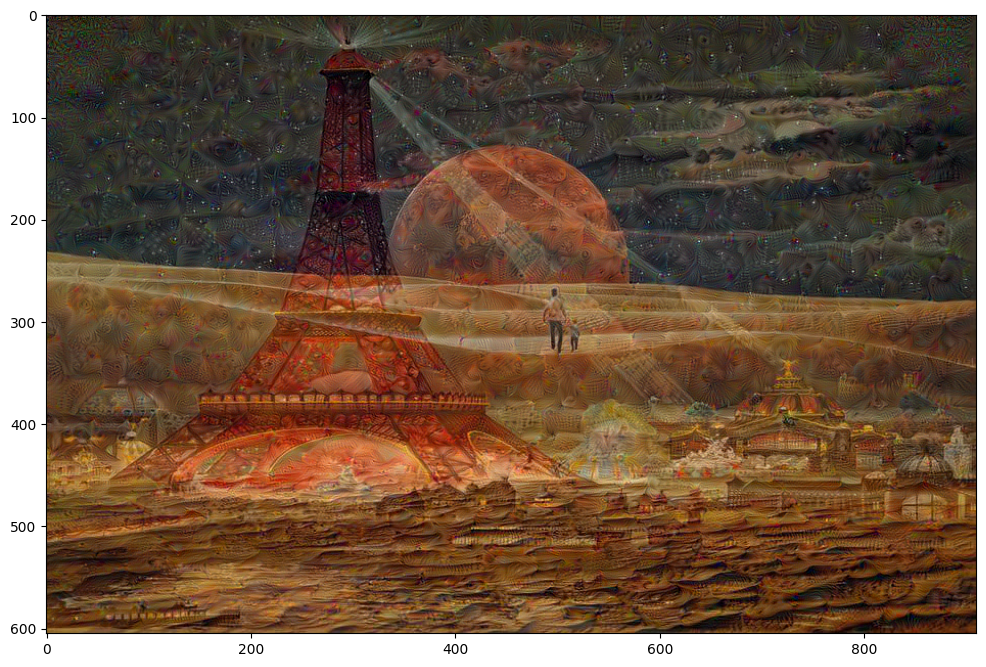

Step 400, loss 1.741758942604065


KeyboardInterrupt: 

In [133]:
# Let's Load the image again and convert it to Numpy array 
Sample_Image = np.array(tf.keras.preprocessing.image.load_img('img_0.jpg'))
dream_img = run_deep_dream_simple(model = deepdream_model, image = Sample_Image, steps = 4000, step_size = 0.001)


# APPLYING DEEPDREAM TO GENERATE A SERIES OF IMAGES

In [135]:
image = tf.keras.preprocessing.image.load_img("img_0.jpg")

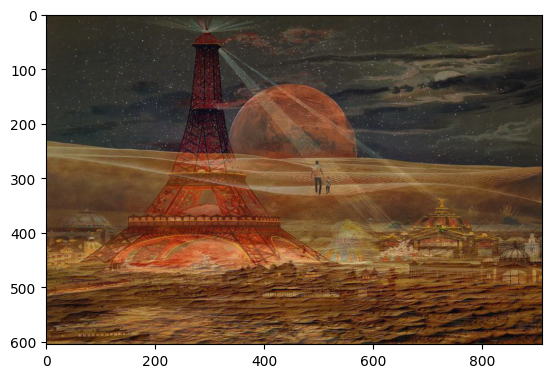

In [137]:
plt.imshow(image)

In [139]:
# Name of the folder
dream_name = 'Dream_folder_generated_images'

In [141]:
# Blended image dimension

x_size = 910 # larger the image longer is going to take to fetch the frames 
y_size = 605

In [143]:
# Define Counters 
created_count = 0
max_count = 50

In [145]:
# This helper function loads an image and returns it as a numpy array of floating points

def load_image(filename):
    image = PIL.Image.open(filename)
    return np.float32(image)

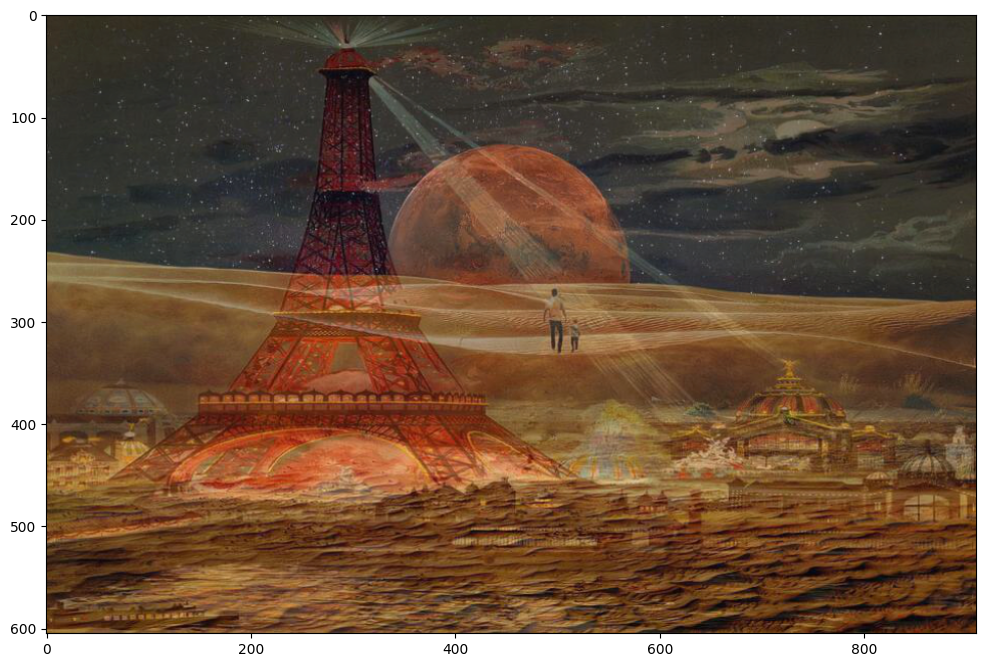

Step 0, loss 0.5755129456520081


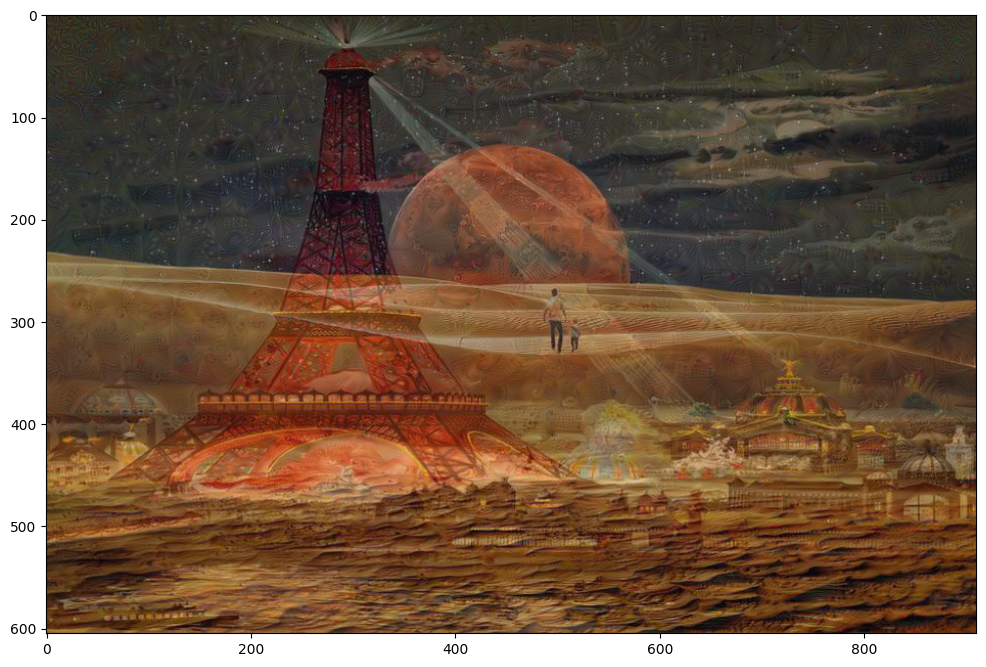

Step 100, loss 1.2901372909545898


KeyboardInterrupt: 

In [147]:
import os
import cv2
import numpy as np
from PIL import Image

# ========== Configuration ==========
base_dir = r"C:\Users\arun2\Downloads\AI_01_Creative-AI"
output_dir = os.path.join(base_dir, r"Creative AI Dataset\Dream_folder_generated_images")
img_name_template = "img_{}.jpg"
max_frames = 50
created_count = 0
max_count = 50

# Load deep dream model here (placeholder, you need to define this)
# from your_model_loader import deepdream_model, run_deep_dream_simple
# Make sure run_deep_dream_simple(model, image, steps, step_size) works correctly

# ========== Load Initial Image ==========
def load_image(path):
    img = Image.open(path)
    return np.array(img)

# ========== Create Output Folder if Needed ==========
os.makedirs(output_dir, exist_ok=True)

# ========== Loop to Create Deep Dream Frames ==========
for i in range(0, max_frames):
    next_img_path = os.path.join(output_dir, img_name_template.format(i+1))

    if os.path.isfile(next_img_path):
        print(f"{i+1} present already, continue fetching the frames...")
        continue

    # Load previous image (start from img_0)
    curr_img_path = os.path.join(output_dir if i > 0 else base_dir, img_name_template.format(i))
    if not os.path.isfile(curr_img_path):
        print(f"Image not found: {curr_img_path}")
        break

    img_result = load_image(curr_img_path)

    # Get image size
    y_size, x_size = img_result.shape[:2]

    # Zoom (chop edges and resize)
    x_zoom = 2
    y_zoom = 1
    img_result = img_result[y_zoom:y_size-y_zoom, x_zoom:x_size-x_zoom]
    img_result = cv2.resize(img_result, (x_size, y_size))

    # RGB adjustment
    img_result = img_result.astype(np.int32)  # Prevent overflow
    img_result[:, :, 0] += 2
    img_result[:, :, 1] += 2
    img_result[:, :, 2] += 2

    # Clip to valid range before Deep Dream
    img_result = np.clip(img_result, 0, 255).astype(np.uint8)

    # ===== Deep Dream Process =====
    img_result = run_deep_dream_simple(model=deepdream_model, image=img_result, steps=500, step_size=0.001)

    # Final processing
    img_result = np.clip(img_result, 0, 255).astype(np.uint8)
    result_image = Image.fromarray(img_result)

    # Save result
    result_image.save(next_img_path)
    print(f"Saved: {next_img_path}")

    created_count += 1
    if created_count > max_count:
        print("Max generation count reached.")
        break
